In [1]:
import os
import re
import numpy as np
from skimage import transform
import cv2
from matplotlib import pyplot as plt
from scipy.spatial import distance
from typing import Callable,Optional

plt.set_cmap('gray')
plt.rcParams["figure.figsize"] = [10, 7];
folderCan = '../imgs/can/'  
pathsCan = [
    os.path.join(folderCan, re.fullmatch("frame\d\d\.jpg", p).string)
    for p in os.listdir(folderCan)
    if re.fullmatch("frame\d\d\.jpg", p)
]
folderMan = '../imgs/Man/'  
pathsMan = [
    os.path.join(folderMan, re.fullmatch("\d\d\d\d\.jpg", p).string)
    for p in os.listdir(folderMan)
    if re.fullmatch("\d\d\d\d\.jpg", p)
]

<Figure size 640x480 with 0 Axes>

In [2]:
def drawVectorFlow(img:np.ndarray, keypoints:np.ndarray, flowVectors: np.ndarray,size:int = 2 ,scaleFactor:int = 5)->np.ndarray:
    """
    Draws optical vector flow over image.

    Parameters
    ----------
    img : np.ndarray
        Input image.
    keypoints : np.ndarray
        Keypoints.
    flowVectors : np.ndarray
        Optical vector flow.
    size : int, optional
        Size of line, by default 2
    scaleFactor : int, optional
        Scaling factor of optical vector, by default 5

    Returns
    -------
    np.ndarray
        Output image.
    """
    img = img.copy()
    A = [(int(round(x)),int(round(y))) for (x,y) in keypoints]
    B = [(int(round(x)),int(round(y))) for (x,y) in keypoints+scaleFactor*flowVectors]
    for (x1, y1), (x2, y2) in zip(A,B):
        img = cv2.arrowedLine(img, (x1, y1), (x2, y2),(0, 255, 0), size,cv2.LINE_AA,0,0.2)
    return img
def drawKeypoints(img: np.ndarray, keypoints:np.ndarray, size:int = 3)->np.ndarray:
    """
    Draws keypoints over input image.

    Parameters
    ----------
    img : np.ndarray
        Input image
    keypoints : np.ndarray
        Keypoint.
    size : int, optional
        Size of dots, by default 3

    Returns
    -------
    np.ndarray
        Output image.
    """
    img = img.copy()
    keypoints = [(int(round(x)),int(round(y))) for (x,y) in keypoints.copy()]
    for point in keypoints:
        img = cv2.circle(img,point,size,(255,0,0),-1)
    return img
def createWindow(x:float, y:float, window_size:int)->tuple[slice,slice]:
    """
    Creates window (tuple of slices) size of window_size over the input coordinates x,y.

    Parameters
    ----------
    x : float
        X coordinate.
    y : float
        Y coordinate.
    window_size : int
        Size of window.

    Returns
    -------
    tuple[slice,slice]
        Output tuple of slices.
    """
    x = int(round(x))
    y = int(round(y))
    win_half_size = window_size//2
    return tuple([slice(y-win_half_size,y+win_half_size + (1 if window_size%2 == 1 else 0)),
                  slice(x-win_half_size,x+win_half_size + (1 if window_size%2 == 1 else 0))])

(-0.5, 684.5, 493.5, -0.5)

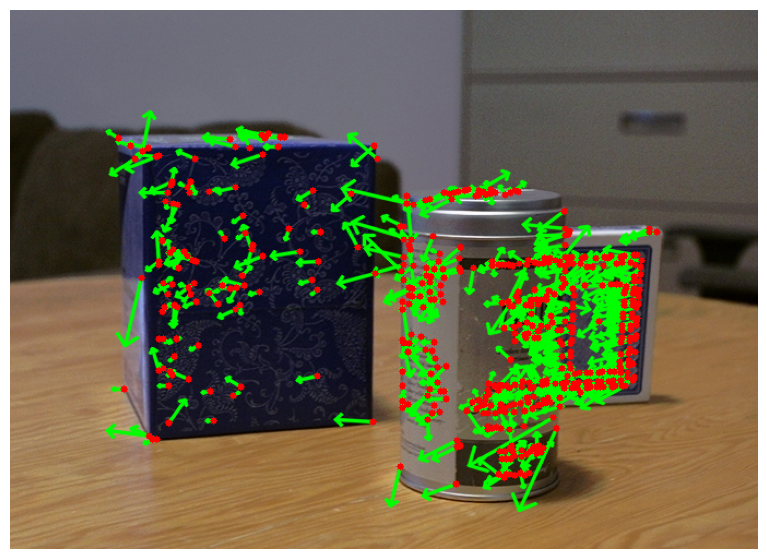

In [3]:

def lucasKanade(img1:np.ndarray, img2:np.ndarray, keypoints:np.ndarray, winSize:int,errThr:Optional[float]=0)->tuple[np.ndarray,np.ndarray]:
    """
    Simple Lucas Kanade implementation.

    Parameters
    ----------
    img1 : np.ndarray
        Current image.
    img2 : np.ndarray
        Next frame of image.
    keypoints : np.ndarray
        Keypoint.
    winSize : int
        Size of window.
    errThr : Optional[float], optional
        Error threshold, by default 0

    Returns
    -------
    tuple[np.ndarray,np.ndarray]
        Returns tuple of optical vector flow and valid keypoints.

    Raises
    ------
    ValueError
        Input img1 and img2 have different shapes.
    TypeError
        Input img1 is not np.uin8 dtype.
    TypeError
        Input img2 is not np.uin8 dtype.
    """
    if img1.shape!= img2.shape:
        raise ValueError('Mismatched shapes, expected same shape for img1 and img2!')
    if img1.dtype != np.uint8:
        raise TypeError (f"For input img1 expected type np.uint8, got {img1.dtype}")
    img1 = img1/255
    if img2.dtype != np.uint8:
        raise TypeError (f"For input img2 expected type np.uint8, got {img2.dtype}")
    img2 = img2/255
    
    flowVectors = np.zeros_like(keypoints, dtype=np.float64)
    validPoints = np.ones(len(keypoints), dtype=bool)
    
    # Calculate spatial gradient of img1
    Iy, Ix = np.gradient(img1)

    for i, (xOld, yOld) in enumerate(keypoints):       
        # Define the search window around the keypoint
        winIndex = createWindow(xOld, yOld, winSize)
        win1 = img1[winIndex]
        win2 = img2[winIndex]

        # Compute A and b matrices for least squares solution
        winIx = Ix[winIndex]
        winIy = Iy[winIndex]
        winIt = win2 - win1
        A = np.c_[winIx.ravel(), winIy.ravel()]
        b = -winIt.ravel()
        
        # Solve least squares problem to get flow vector
        flowVectors[i] = np.linalg.lstsq(A, b, rcond=None)[0]
        u, v  = flowVectors[i]
        # Calculate temporal gradient between img1 and img2
        xNew = xOld + u
        yNew = yOld + v
        
        winOld3 = createWindow(xOld, yOld, 3)
        winNew3 = createWindow(xNew, yNew, 3)
        oldPosition = img1[winOld3]
        oldPosition = oldPosition/oldPosition.sum()
        newPosition = img1[winNew3]
        newPosition = newPosition/newPosition.sum()
        # Check if optical vector flow is out of window scope
        if np.abs(u)> winSize/2 or np.abs(v)> winSize/2:
            validPoints[i] = False
        # Check if there is a large difference in brightness
        if np.mean((oldPosition - newPosition)**2) > errThr:
            validPoints[i] = False         
    return flowVectors, validPoints 
# Optical flow parameters
winSize = 5
# Load images
canImg1 = cv2.imread(pathsCan[0], cv2.IMREAD_GRAYSCALE)  
canImg2 = cv2.imread(pathsCan[1], cv2.IMREAD_GRAYSCALE)
# Optical flow estimation
keypoints = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = np.squeeze(keypoints).astype(np.int64)
flowVectors, validPoints = lucasKanade(canImg1, canImg2, keypoints, winSize)
# Draw keypoints and scaled optical vector flow
imgRGB = cv2.cvtColor(cv2.imread(pathsCan[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
imgRGB = drawVectorFlow(imgRGB, keypoints,flowVectors,scaleFactor=20)
imgRGB = drawKeypoints(imgRGB, keypoints)
plt.figure()
plt.imshow(imgRGB)
plt.axis("off")

In [4]:
def findOptimalErrThr(errThrSpace: np.array, opticalFlowFunction: Callable, distanceThr:float, **kwargs)->np.ndarray:
    """
    Returns precision of correct rejections of opticalFlowFunction estimation.

    Parameters
    ----------
    errThrSpace : np.array
        Span of threshold to search.
    opticalFlowFunction : Callable
        Function for optical flow estimation.
    distanceThr : float
        Threshold for minimum distance between to keypoint to consider close. 

    Returns
    -------
    np.ndarray
        Precision of optical flow function rejection.
    """
    precision = []
    for errThr in errThrSpace :
        canImg1 = cv2.imread(pathsCan[0], cv2.IMREAD_GRAYSCALE) 
        canImg2 = cv2.imread(pathsCan[1], cv2.IMREAD_GRAYSCALE)  
        p0 = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
        p1 = cv2.goodFeaturesToTrack(canImg2,maxCorners=canImg2.size, qualityLevel=0.1,minDistance=3)
        keypoints = np.squeeze(p0).astype(np.int64)
        flowVectors, validPoints = opticalFlowFunction(canImg1, canImg2, keypoints, **kwargs, errThr=errThr)
        badFlow = distance.cdist(p0.reshape(-1,2)+flowVectors,p1.reshape(-1,2)).min(axis=1)>distanceThr
        nNotValid = np.sum(np.logical_not(validPoints))
        nTrueRejected = np.sum(badFlow[np.logical_not(validPoints)])
        precision.append(nTrueRejected/nNotValid * 100) 
    return np.array(precision)

Optimal threshold = 0.004291934260128779


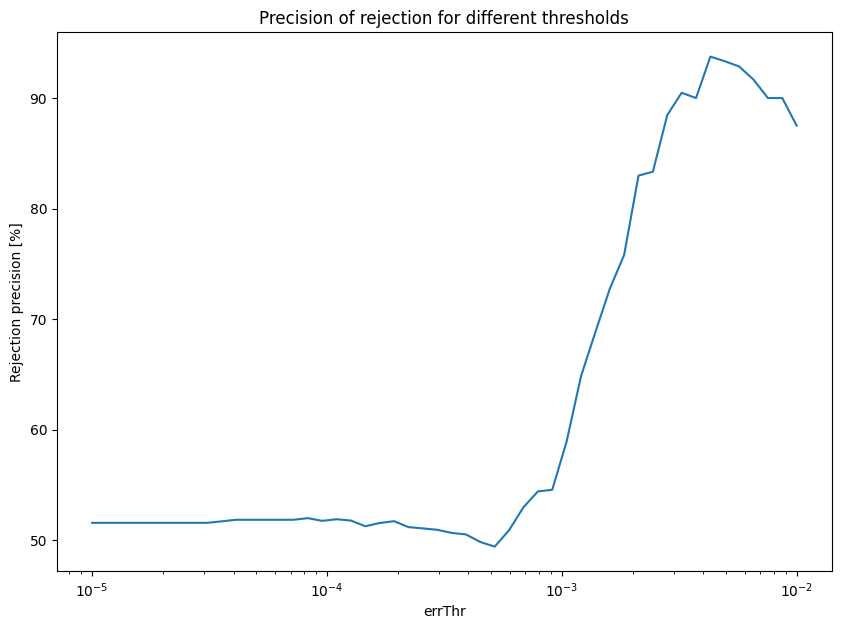

In [5]:
winSize = 5
errThrSpace = np.logspace(-5,-2,50,base=10)
precision = findOptimalErrThr(errThrSpace, lucasKanade, distanceThr=2, winSize=winSize)
plt.plot(errThrSpace,precision, label="precision")
ax = plt.gca()
ax.set_xscale('log')
ax.set_xlabel('errThr')
ax.set_ylabel('Rejection precision [%]')
ax.set_title('Precision of rejection for different thresholds')
errThr = errThrSpace[np.argmax(precision)]
print(f'Optimal threshold = {errThr}')

In [6]:

def runOpticalFlowFolder(folderName:str,errThr:float,opticalFlowFunction:Callable,**kwargs)->None:
    """
    Run opticalFlowFunction function on pathCan files and save in folderName folder.

    Parameters
    ----------
    folderName : str
        Name of folder
    errThr : float
        Error threshold.
    opticalFlowFunction : Callable
        Optical flow estimation function.
    """
    os.makedirs(folderName,exist_ok=True)
    canImg1 = cv2.imread(pathsCan[0], cv2.IMREAD_GRAYSCALE)
    keypoints = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
    keypoints = np.squeeze(keypoints).astype(np.int64)
    for currentPath,nextPath in zip(pathsCan[:-1],pathsCan[1:]):
        savePath = os.path.join(folderName,os.path.basename(currentPath))
        currentFrame = int(os.path.basename(currentPath)[5:7])
        canImg2 = cv2.imread(nextPath, cv2.IMREAD_GRAYSCALE)
        flowVectors, validPoints = opticalFlowFunction(canImg1, canImg2, keypoints,**kwargs, errThr=errThr)
        keypointImgRGB = cv2.cvtColor(cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
        cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
        if currentFrame in [1,5,9]:
            plt.figure()
            plt.imshow(keypointImgRGB)
            plt.axis("off")
            plt.title(f'Frame: {currentFrame}')
        canImg1 = canImg2
        keypointImgRGB = cv2.cvtColor(cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        keypoints = np.round(keypoints[validPoints] + flowVectors[validPoints]).astype(np.int64)
    # Save the last frame keypoints to disk
    currentFrame = int(os.path.basename(pathsCan[-1])[5:7])
    savePath = os.path.join(folderName,os.path.basename(pathsCan[-1]))
    keypointImgRGB = cv2.cvtColor(cv2.imread(pathsCan[-1], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
    cv2.imwrite(savePath,cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
    plt.figure()
    plt.imshow(keypointImgRGB)
    plt.axis("off")
    plt.title(f'Frame: {currentFrame}')


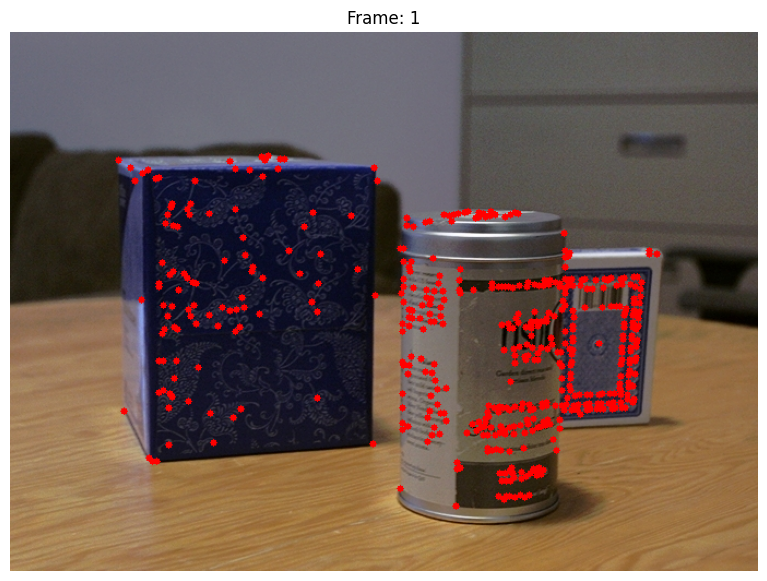

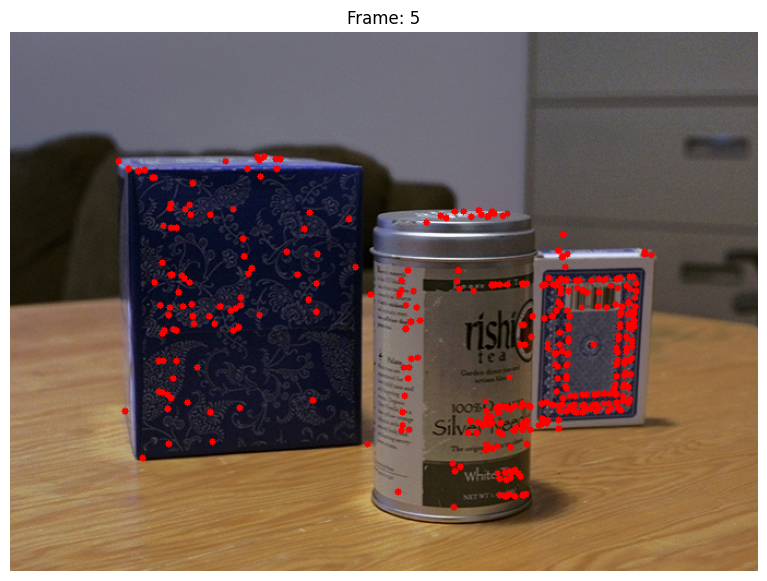

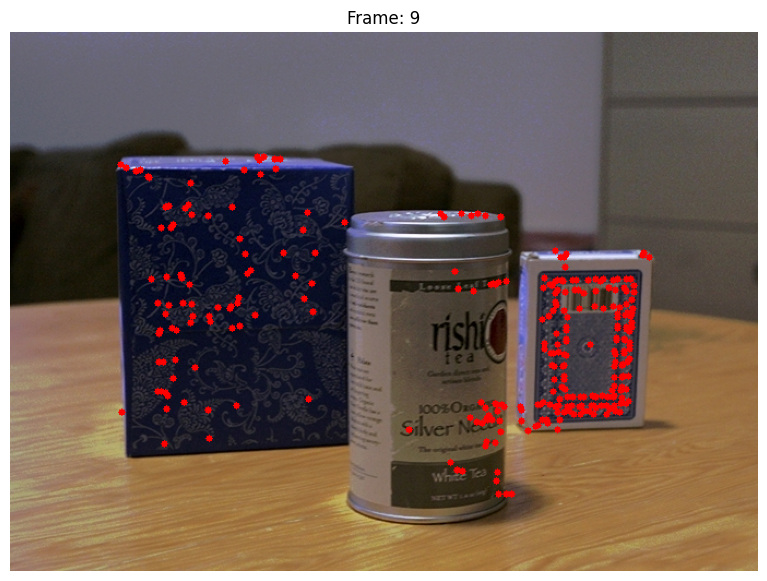

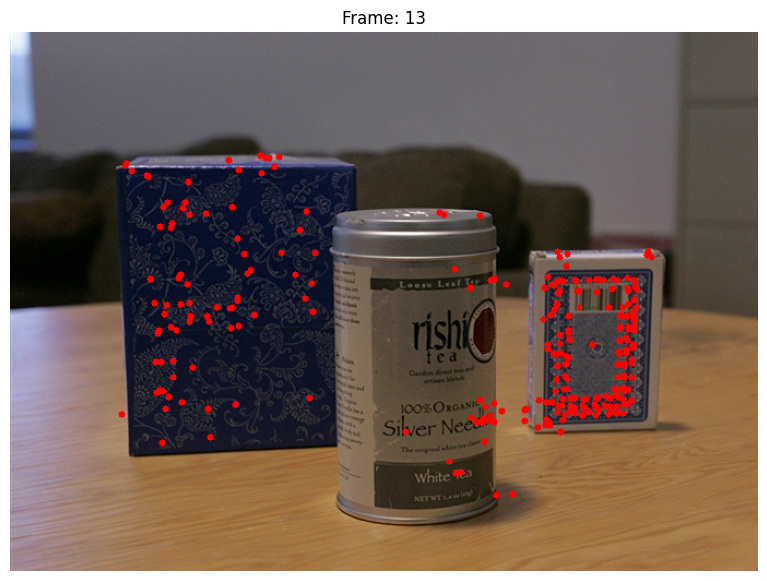

In [7]:
folderName = 'CanLK/'
winSize = 5
runOpticalFlowFolder(folderName,errThr,lucasKanade,winSize=winSize)

(-0.5, 684.5, 493.5, -0.5)

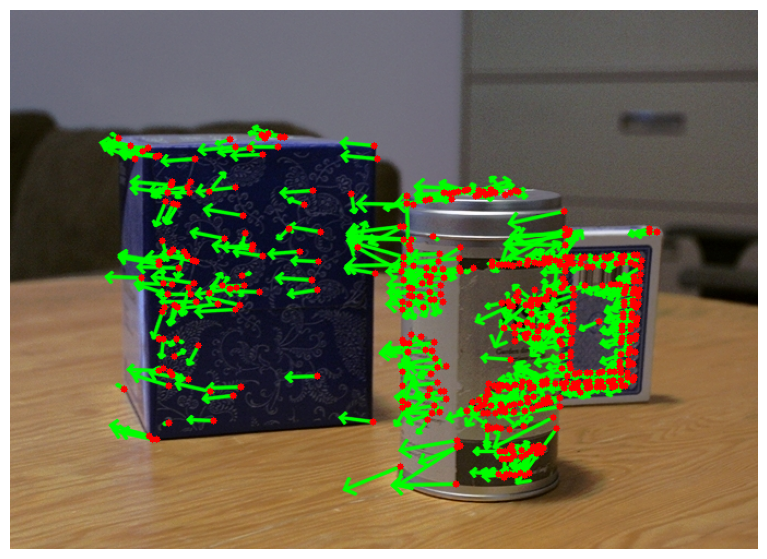

In [8]:
def lucasKanadeIter(img1:np.ndarray, img2:np.ndarray, keypoints:np.ndarray, winSize:int, numIter:int, initFlow:Optional[np.ndarray]=None, errThr:Optional[float]=0)->tuple[np.ndarray,np.ndarray]:
    """
    Iterative Lucas Kanade implementation.

    Parameters
    ----------
    img1 : np.ndarray
        Current image.
    img2 : np.ndarray
        Next frame of image.
    keypoints : np.ndarray
        Keypoint.
    winSize : int
        Size of window.
    numIter : int
        Number of iterations.
    initFlow : Optional[np.ndarray], optional
        Initial estimation of optical flow, by default None
    errThr : Optional[float], optional
        Error threshold, by default 0

    Returns
    -------
    tuple[np.ndarray,np.ndarray]
        Returns tuple of optical vector flow and valid keypoints.

    Raises
    ------
    ValueError
        Input img1 and img2 have different shapes.
    TypeError
        Input img1 is not np.uin8 dtype.
    TypeError
        Input img2 is not np.uin8 dtype.
    """
    if img1.shape!= img2.shape:
        raise ValueError('Mismatched shapes, expected same shape for img1 and img2!')
    if img1.dtype != np.uint8:
        raise TypeError (f"For input img1 expected type np.uint8, got {img1.dtype}")
    img1 = img1/255
    if img2.dtype != np.uint8:
        raise TypeError (f"For input img2 expected type np.uint8, got {img2.dtype}")
    img2 = img2/255
    
    if initFlow is None:
        flowVectors = np.zeros_like(keypoints, dtype=np.float64)
    else:
        flowVectors = initFlow.copy()
    validPoints = np.ones(len(keypoints), dtype=bool)
    
    # Calculate spatial gradient of img1
    Iy, Ix = np.gradient(img1)
    
    for i, (xOld, yOld) in enumerate(keypoints):
        u, v  = flowVectors[i]
        xNew = xOld + u
        yNew = yOld + v
        # Define the search window around the keypoint
        winIndex1 = createWindow(xOld, yOld, winSize)      
        win1 = img1[winIndex1]

        winIx = Ix[winIndex1]
        winIy = Iy[winIndex1]
        # Iteratively find better optical flow estimation
        for _ in range(numIter):
            winIndex2 = createWindow(xNew, yNew, winSize)
            win2 = img2[winIndex2]
            # Calculate temporal gradient between img1 and img2
            winIt = (win2 - win1)
            # Compute A and b matrices for least squares solution
            A = np.c_[winIx.ravel(), winIy.ravel()]
            b = -winIt.ravel()
            
            # Solve least squares problem to get flow vector
            flowVectors[i] += np.linalg.lstsq(A, b, rcond=None)[0]
            u, v  = flowVectors[i]
            
            xNew = xOld + u
            yNew = yOld + v
            # Check if optical vector flow is out of window scope
            if np.abs(u)> winSize/2 or np.abs(v)> winSize/2:
                validPoints[i] = False
                break   
        winOld3 = createWindow(xOld, yOld, 3)
        winNew3 = createWindow(xNew, yNew, 3)
        oldPosition = img1[winOld3]
        oldPosition = oldPosition/oldPosition.sum()
        newPosition = img1[winNew3]
        newPosition = newPosition/newPosition.sum()
        
        # Check if there is a large difference in brightness
        if np.mean((oldPosition - newPosition)**2) > errThr:
            validPoints[i] = False

    return flowVectors, validPoints
# Optical flow parameters
winSize = 9
numIter = 7
initFlow = np.zeros_like(keypoints,dtype=np.float64)
# Load images
canImg1 = cv2.imread(pathsCan[0], cv2.IMREAD_GRAYSCALE)  
canImg2 = cv2.imread(pathsCan[1], cv2.IMREAD_GRAYSCALE)
# Optical flow estimation
p0 = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = np.squeeze(keypoints).astype(np.int64)
flowVectors, validPoints = lucasKanadeIter(canImg1, canImg2, keypoints, winSize,numIter,initFlow)
# Draw keypoints and scaled optical vector flow
imgRGB = cv2.cvtColor(cv2.imread(pathsCan[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
imgRGB = drawVectorFlow(imgRGB, keypoints,flowVectors,scaleFactor=10)
imgRGB = drawKeypoints(imgRGB, keypoints)
plt.figure()
plt.imshow(imgRGB)
plt.axis("off")

Optimal threshold = 0.004291934260128779


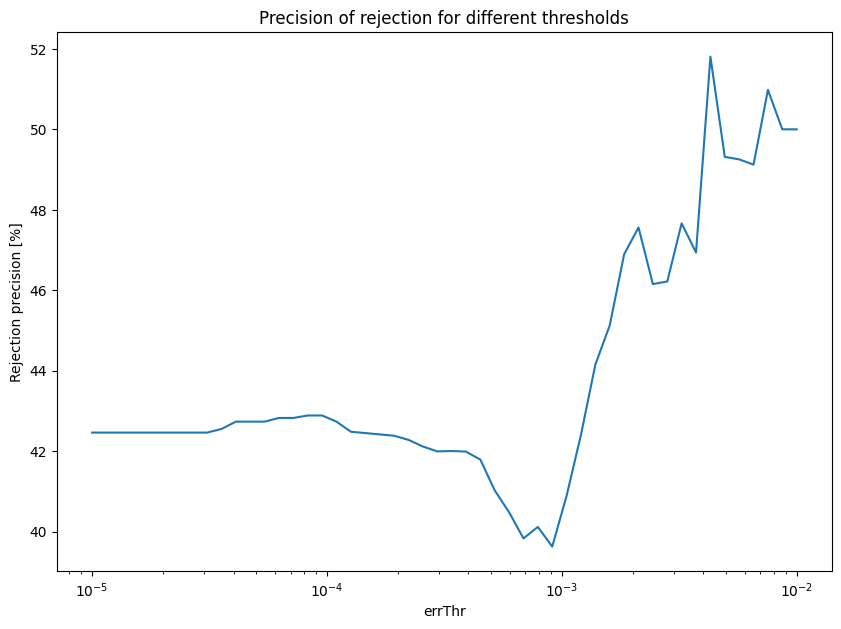

In [9]:
winSize = 9
numIter = 7
errThrSpace = np.logspace(-5,-2,50,base=10)
precision = findOptimalErrThr(errThrSpace, lucasKanadeIter, distanceThr=2, winSize=winSize,numIter=numIter)
plt.plot(errThrSpace,precision, label="precision")
ax = plt.gca()
ax.set_xscale('log')
ax.set_xlabel('errThr')
ax.set_ylabel('Rejection precision [%]')
ax.set_title('Precision of rejection for different thresholds')
errThr = errThrSpace[np.argmax(precision)]
print(f'Optimal threshold = {errThr}')

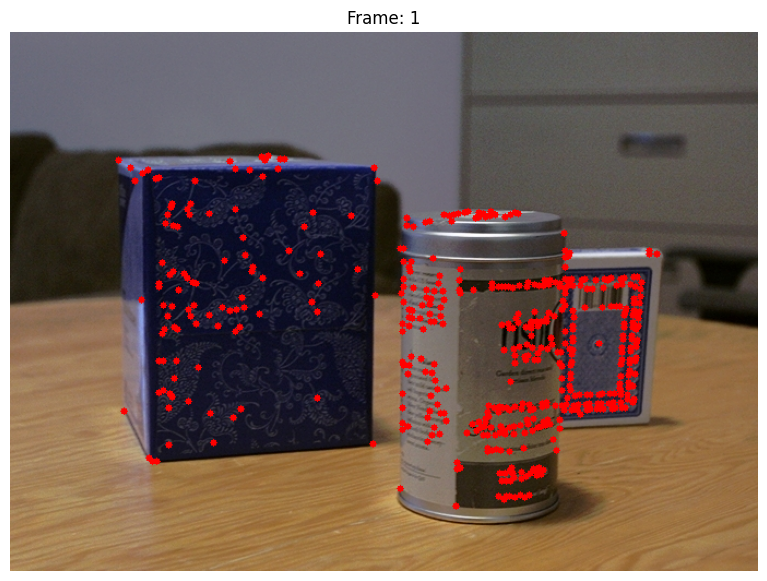

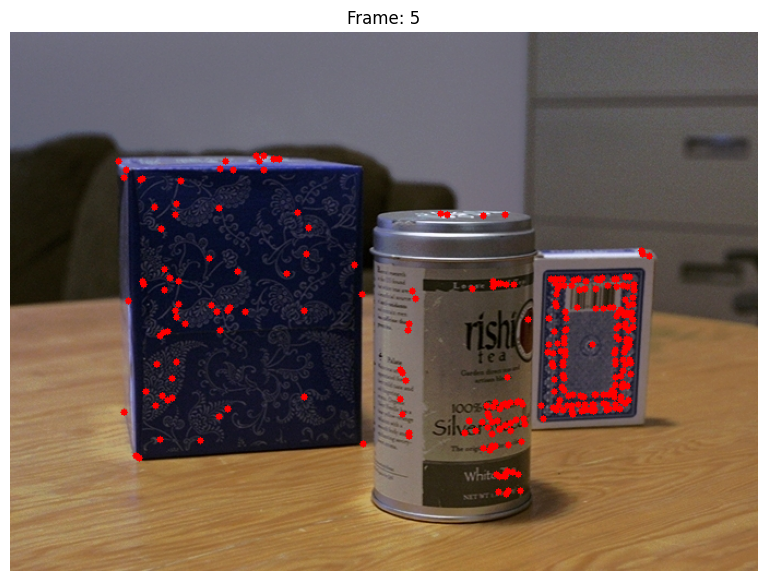

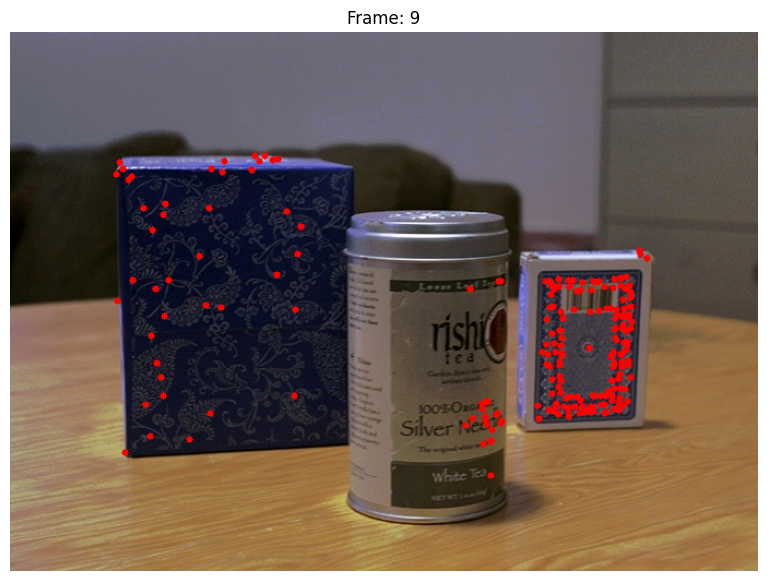

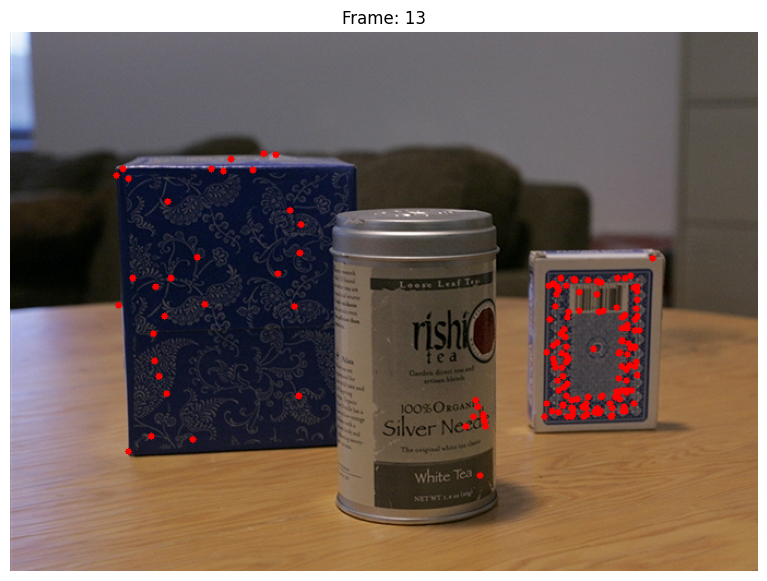

In [10]:
winSize = 9
numIter = 7
folderName = 'CanLKiter/'
runOpticalFlowFolder(folderName,errThr,lucasKanadeIter,winSize=winSize,numIter=numIter)

(-0.5, 684.5, 493.5, -0.5)

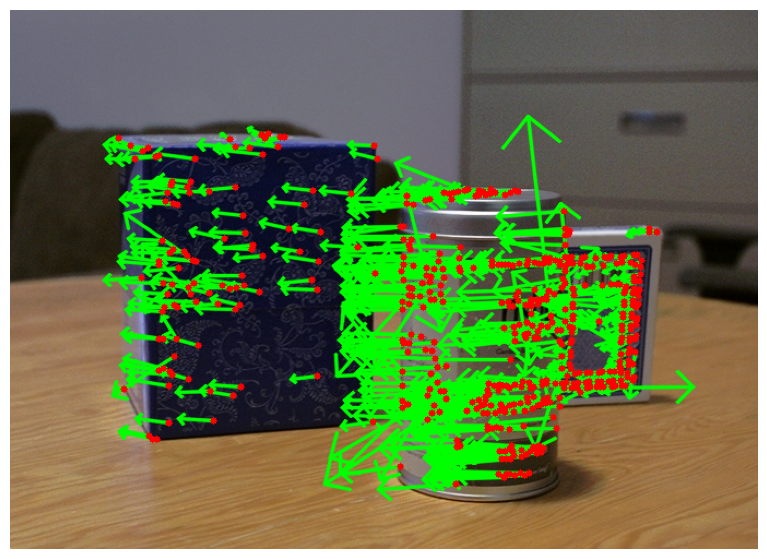

In [11]:
def pyrLucasKanade(img1:np.ndarray, img2:np.ndarray, keypoints:np.ndarray, winSize:int, numIter:int, levelNum:int, levelScale:float, errThr:Optional[float]=0)->tuple[np.ndarray,np.ndarray]:
    """
    Pyramid Lucas Kanade implementation.

    Parameters
    ----------
    img1 : np.ndarray
        Current image.
    img2 : np.ndarray
        Next frame of image.
    keypoints : np.ndarray
        Keypoints.
    winSize : int
        Size of window.
    numIter : int
        Number of iterations.
    levelNum : int
        Number of pyramid levels.
    levelScale : float
        Scale reduction per pyramid level.
    errThr : Optional[float], optional
        Error threshold, by default 0

    Returns
    -------
    tuple[np.ndarray,np.ndarray]
        Returns tuple of optical vector flow and valid keypoints.

    Raises
    ------
    ValueError
        Input img1 and img2 have different shapes.
    TypeError
        Input img1 is not np.uin8 dtype.
    TypeError
        Input img2 is not np.uin8 dtype.
    """
    if img1.shape!= img2.shape:
        raise ValueError('Mismatched shapes, expected same shape for img1 and img2!')
    if img1.dtype != np.uint8:
        raise TypeError (f"For input img1 expected type np.uint8, got {img1.dtype}")
    img1 = img1/255
    if img2.dtype != np.uint8:
        raise TypeError (f"For input img2 expected type np.uint8, got {img2.dtype}")
    img2 = img2/255
    flowVectors = np.zeros_like(keypoints, dtype=np.float32)
    validPoints = np.ones(len(keypoints), dtype=bool)
    
    if levelNum > 0:
        levelNum -= 1
    # Pyramid creation order form most to least blurred
    pyramid1 = list(transform.pyramid_gaussian(img1, max_layer=levelNum, downscale=levelScale))[::-1]
    pyramid2 = list(transform.pyramid_gaussian(img2, max_layer=levelNum, downscale=levelScale))[::-1]
    
    prevShape = np.array(pyramid1[0].shape[::-1])
    ratio = (np.array(pyramid1[0].shape[::-1])/np.array(pyramid1[-1].shape[::-1]))
    # Scale keypoint to most blurred scale
    keypoints = keypoints * ratio
    
    for img1, img2 in zip(pyramid1,pyramid2):

        currentShape = np.array(img1.shape[::-1])
        # Calculate spatial gradient of img1
        Iy, Ix = np.gradient(img1)
        # Update optical vector flow and keypoint to new scale
        flowVectors = flowVectors * (currentShape/prevShape)
        keypoints = keypoints * (currentShape/prevShape)
        for i, (xOld, yOld) in enumerate(keypoints):
            if not validPoints[i]:
                continue
            u, v  = flowVectors[i]
            xNew = xOld + u
            yNew = yOld + v
            # Define the search window around the keypoint
            winIndex1 = createWindow(xOld, yOld, winSize)      
            win1 = img1[winIndex1]

            winIx = Ix[winIndex1]
            winIy = Iy[winIndex1]
            # Iteratively find better optical flow estimation
            for _ in range(numIter):
                winIndex2 = createWindow(xNew, yNew, winSize)
                win2 = img2[winIndex2]
                # Check if windows are close to the border 
                if win1.shape != win2.shape:
                    break
                # Calculate temporal gradient between img1 and img2
                winIt = (win2 - win1)
                # Compute A and b matrices for least squares solution
                A = np.c_[winIx.ravel(), winIy.ravel()]
                b = -winIt.ravel()
                
                # Solve least squares problem to get flow vector
                flowVectors[i] += np.linalg.lstsq(A, b, rcond=None)[0]
                u, v  = flowVectors[i]
                
                xNew = xOld + u
                yNew = yOld + v
                dist = np.sqrt(u**2 + v**2)
                if  dist < 0.1:
                    break
        prevShape = currentShape
    # Check if estimated optical flow is valid
    for i, (xOld, yOld) in enumerate(keypoints):
        u, v  = flowVectors[i]
        xNew = xOld + u
        yNew = yOld + v
        # Check if optical vector flow is out of window scope
        if np.abs(u)> ((winSize//2) / ratio[0]) or np.abs(v)> ((winSize//2) / ratio[1]):
            validPoints[i] = False 
        winOld3 = createWindow(xOld, yOld, 3)
        winNew3 = createWindow(xNew, yNew, 3)
        oldPosition = img1[winOld3]
        oldPosition = oldPosition/oldPosition.sum()
        newPosition = img1[winNew3]
        newPosition = newPosition/newPosition.sum()
        # Check if windows are close to the border 
        if oldPosition.shape != newPosition.shape:
            validPoints[i] = False
            continue
        # Check if there is a large difference in brightness
        if np.mean((oldPosition - newPosition)**2) > errThr:
            validPoints[i] = False
        
    return flowVectors, validPoints
# Optical flow parameters
winSize = 9
numIter = 7
levelNum = 3
levelScale = 2
# Load images
canImg1 = cv2.imread(pathsCan[0], cv2.IMREAD_GRAYSCALE)  
canImg2 = cv2.imread(pathsCan[1], cv2.IMREAD_GRAYSCALE)
# Optical flow estimation
p0 = cv2.goodFeaturesToTrack(canImg1,maxCorners=canImg1.size, qualityLevel=0.1,minDistance=3)
keypoints = np.squeeze(p0).astype(np.int64)
initFlow = np.zeros_like(keypoints,dtype=np.float64)
# Draw keypoints and scaled optical vector flow
flowVectors, validPoints = pyrLucasKanade(canImg1, canImg2, keypoints, winSize,numIter,levelNum,levelScale)
imgRGB = cv2.cvtColor(cv2.imread(pathsCan[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
imgRGB = drawVectorFlow(imgRGB, keypoints,flowVectors,scaleFactor=10)
imgRGB = drawKeypoints(imgRGB, keypoints)
plt.figure()
plt.imshow(imgRGB)
plt.axis("off")

Optimal threshold = 0.01438449888287663


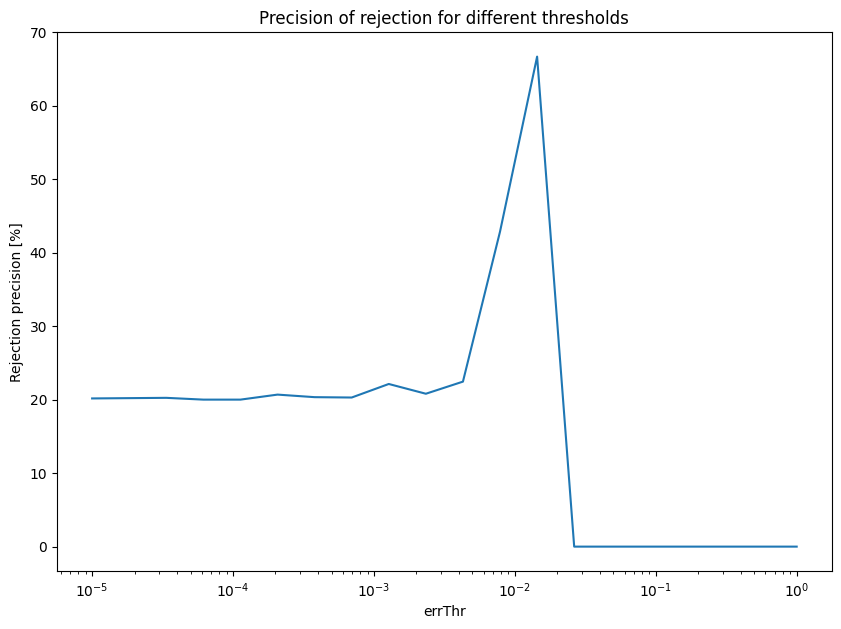

In [12]:
winSize = 9
numIter = 7 
levelNum = 3
levelScale = 2
errThrSpace = np.logspace(-5,0,20,base=10)
precision = findOptimalErrThr(errThrSpace, pyrLucasKanade, distanceThr=2, winSize=winSize,numIter=numIter,levelNum=levelNum,levelScale=levelScale)
plt.plot(errThrSpace,precision, label="precision")
ax = plt.gca()
ax.set_xscale('log')
ax.set_xlabel('errThr')
ax.set_ylabel('Rejection precision [%]')
ax.set_title('Precision of rejection for different thresholds')
errThr = errThrSpace[np.argmax(precision)]
print(f'Optimal threshold = {errThr}')

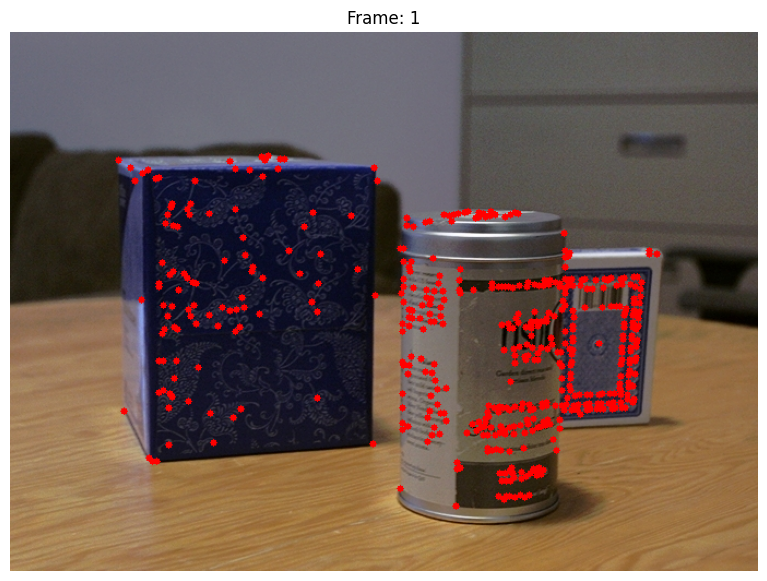

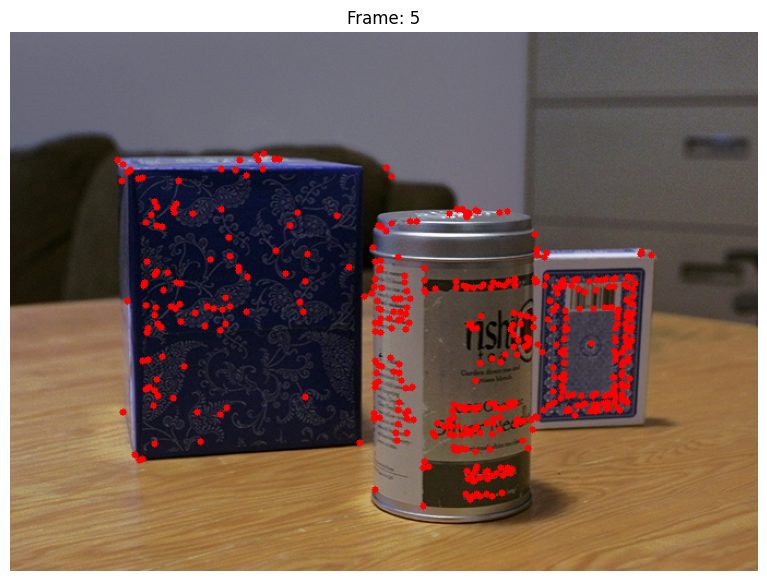

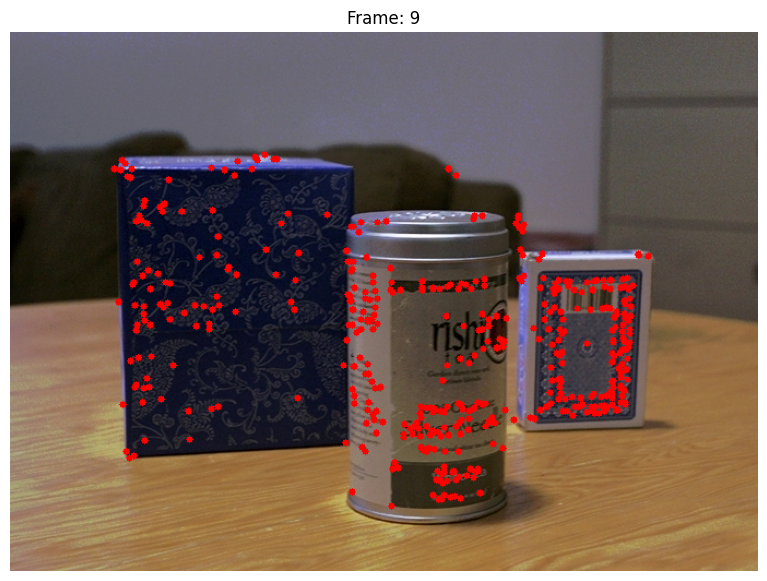

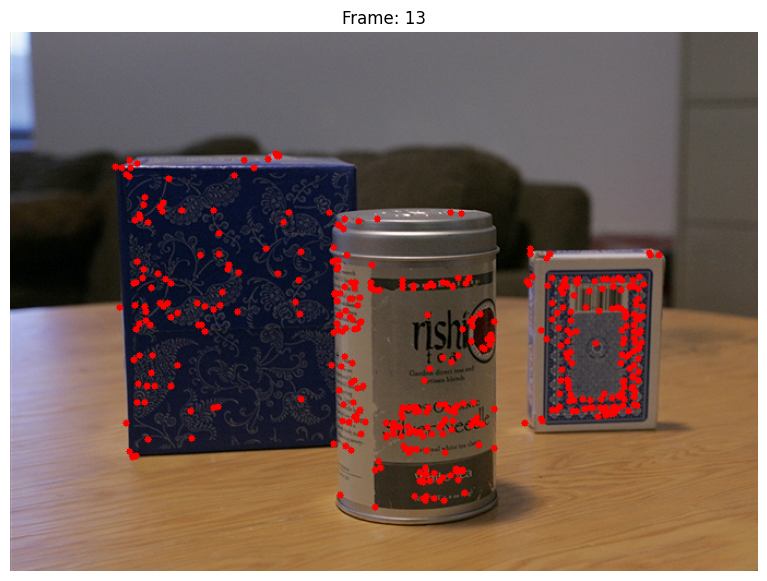

In [13]:
winSize = 9
numIter = 7
levelNum = 3
levelScale = 2
folderName = 'CanLKpyr/'
runOpticalFlowFolder(folderName,errThr,pyrLucasKanade,winSize=winSize,numIter=numIter,levelNum=levelNum,levelScale=levelScale)

In [14]:
# Optical flow parameters
winSize = 9
numIter = 7
levelNum = 3
levelScale = 2
errThr = 0.1
# Initial box position 
faceStart = np.array([65,45])
faceShape = np.array([35,45])
faceEnd = (faceStart[0]+faceShape[0],faceStart[1]+faceShape[1])
# Video recording objects
shape = cv2.imread(pathsMan[0], cv2.IMREAD_GRAYSCALE).shape[::-1]
videoRect = cv2.VideoWriter('man_track.mp4', 0, 12,shape)
videoRectValid = cv2.VideoWriter('man_track_valid.mp4', 0, 12, shape)
videoRectValidFlow = cv2.VideoWriter('man_track_valid_flow.mp4', 0, 12, shape)

for currentPath,nextPath in zip(pathsMan[:-1],pathsMan[1:]):
    # Initialization of frames
    currentFrame = int(os.path.basename(currentPath).split('.')[-2])
    manImg1 = cv2.imread(currentPath, cv2.IMREAD_GRAYSCALE) 
    manImg2 = cv2.imread(nextPath, cv2.IMREAD_GRAYSCALE)
    faceStartInt = np.round(faceStart).astype(np.int64)
    faceEndInt = np.round(faceEnd).astype(np.int64)
    # Refresh keypoints
    if (currentFrame-1) % 20 == 0 :
        manImg1Cropped = manImg1[faceStartInt[1]:faceEndInt[1],faceStartInt[0]:faceEndInt[0]]
        keypoints = cv2.goodFeaturesToTrack(manImg1Cropped,maxCorners=manImg1Cropped.size, qualityLevel=0.1,minDistance=3)
        keypoints = np.squeeze(keypoints + faceStart).astype(np.int64)
    # Optical flow  
    flowVectors, validPoints = pyrLucasKanade(manImg1, manImg2, keypoints, winSize,numIter,levelNum,levelScale,errThr)
    # Draw box, keypoints and optical flow
    imgRGB = cv2.cvtColor(cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    imgRGB = cv2.rectangle(imgRGB, faceStartInt, faceEndInt, (0,255,0), 1)
    videoRect.write(cv2.cvtColor(imgRGB, cv2.COLOR_RGB2BGR))
    imgRGB = drawKeypoints(imgRGB, keypoints, size=1)
    videoRectValid.write(cv2.cvtColor(imgRGB, cv2.COLOR_RGB2BGR))
    imgRGB = drawVectorFlow(imgRGB, keypoints,flowVectors,size=1,scaleFactor=3)
    videoRectValidFlow.write(cv2.cvtColor(imgRGB, cv2.COLOR_RGB2BGR))
    # Iteratively remove keypoints out of scope and average valid movement for the updated position
    changeFlag = True
    while changeFlag:
        faceStartCandidate = faceStart + np.mean(flowVectors[validPoints], axis=0)
        faceEndCandidate = faceStartCandidate + faceShape
        changeFlag = False
        for i, (x,y) in enumerate(keypoints):
            if x<faceStartCandidate[0] or x>faceEndCandidate[0] or y<faceStartCandidate[1] or y>faceEndCandidate[1]:
                if validPoints[i]:
                    validPoints[i] = False
                    changeFlag = True
    # Update box position and valid keypoints            
    faceStart = faceStartCandidate
    faceEnd = faceEndCandidate
    keypoints =  np.round(keypoints[validPoints] + flowVectors[validPoints]).astype(np.int64)
# Save videos
cv2.destroyAllWindows()
videoRect.release()
videoRectValid.release()
videoRectValidFlow.release()